In [ ]:
# %%

import time
import functools
import torch
from torch.utils.data import DataLoader
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForCausalLM, PreTrainedModel
from transformers.models.llama import LlamaModel
from transformers.models.gpt2 import GPT2Model
from enum import Enum
from types import SimpleNamespace
from typing import Union, Dict
from einops import rearrange, reduce

/home/clankur/conda/envs/sparsity_analysis/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# %%

class DatasetTypes(Enum):
    WIKI = ("wikitext", "wikitext-2-raw-v1")
    INTERNET = ("allenai/c4", "en")
    CODE = "bigcode/starcoderdata"
    ASSISTANT = "HuggingFaceH4/ultrachat_200k"


class ModelTypes(Enum):
    GPT2 = "gpt2"
    LLAMA = "meta-llama/Meta-Llama-3.1-8B"
    GEMMA = "google/gemma-2-9b-it"
    TINY_LLAMA = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"


class SeqLenFilterDataLoader(DataLoader):
    def __init__(self, dataset, min_seq_len, true_batch_size, *args, **kwargs):
        self.min_seq_len = min_seq_len
        self.true_batch_size = true_batch_size
        super().__init__(dataset, *args, collate_fn=self.collate_fn, **kwargs)

    def collate_fn(self, batch):
        filtered_batch = [
            item for item in batch if item["input_ids"].size(1) >= self.min_seq_len
        ]

        if not filtered_batch:
            return None

        input_ids = [item["input_ids"].squeeze(0) for item in filtered_batch]

        return {"input_ids": input_ids}

    def __iter__(self):
        itr = super().__iter__()
        batch = []
        try:
            while True:
                while len(batch) < self.true_batch_size:
                    new_batch = next(itr)["input_ids"]
                    if new_batch:
                        batch.extend(new_batch)
                yield batch[: self.true_batch_size]
                batch = batch[self.true_batch_size :]
        except StopIteration:
            print("out of elements in dataset")

In [ ]:
# %%

def get_dataset(dataset_type: DatasetTypes, tokenizer):
    if dataset_type == DatasetTypes.WIKI or dataset_type == DatasetTypes.INTERNET:
        dataset = load_dataset(
            dataset_type.value[0], dataset_type.value[1], streaming=True, split="train"
        )

    else:
        dataset = load_dataset(dataset_type.value, streaming=True, split="train")

    tokenize = functools.partial(
        tokenizer,
        padding=False,
        truncation=True,
        max_length=seq_len,
        add_special_tokens=False,
        return_token_type_ids=False,
        return_attention_mask=False,
        return_tensors="pt",
    )
    dataset = dataset.shuffle(seed=seed)
    if dataset_type == DatasetTypes.CODE:
        tokenized = dataset.select_columns(["content"]).map(
            tokenize, input_columns=["content"], remove_columns=["content"]
        )
    else:
        tokenized = dataset.select_columns(["text"]).map(
            tokenize, input_columns=["text"], remove_columns=["text"]
        )
    dataloader = SeqLenFilterDataLoader(
        tokenized, seq_len, true_batch_size=batch_size, batch_size=256
    )
    return iter(dataloader)


def get_tokenizer_model(model_type: ModelTypes):
    model_name = model_type.value
    return AutoTokenizer.from_pretrained(
        model_name
    ), AutoModelForCausalLM.from_pretrained(model_name, output_attentions=True)


def get_model_config(
    model_type: ModelTypes, model: Union[LlamaModel, GPT2Model, PreTrainedModel]
) -> SimpleNamespace:
    if model_type == ModelTypes.GPT2:
        return SimpleNamespace(n_layer=model.config.n_layer, n_head=model.config.n_head)
    return SimpleNamespace(
        n_layer=model.config.num_hidden_layers,
        n_head=model.config.num_attention_heads,
        seq_len=model.config.max_position_embeddings,
    )

In [ ]:
# %%

deep_dive_heads = False
seed = 0
batch_size = 4
num_of_samples = 192 
dataset_type = DatasetTypes.CODE
model_type = ModelTypes.TINY_LLAMA

In [ ]:
# %%

tokenizer, model = get_tokenizer_model(model_type)
config = get_model_config(model_type, model)
seq_len = config.seq_len
config

namespace(n_layer=22, n_head=32, seq_len=2048)

In [ ]:
# %%

stream = get_dataset(dataset_type, tokenizer)

In [ ]:
# %%

head_metrics = {
    "cum_prob": {
        "best": torch.zeros((batch_size, config.n_layer, config.n_head, seq_len)),
        "avg": torch.zeros((batch_size, config.n_layer, config.n_head, seq_len)),
        "worst": torch.ones((batch_size, config.n_layer, config.n_head, seq_len)),
    },
    "att_wei": {
        "best": torch.zeros((batch_size, config.n_layer, config.n_head, seq_len)),
        "avg": torch.zeros((batch_size, config.n_layer, config.n_head, seq_len)),
        "worst": torch.ones((batch_size, config.n_layer, config.n_head, seq_len)),
    },
}
layer_cumsum_metrics = {
    "best": torch.zeros((batch_size, config.n_layer, config.n_head * seq_len)),
    "avg": torch.zeros((batch_size, config.n_layer, config.n_head * seq_len)),
    "worst": torch.full(
        (batch_size, config.n_layer, config.n_head * seq_len), torch.inf
    ),
}

In [ ]:
# %%

start_time = time.time()
for i in range(num_of_samples):
    cur_seq_len = 0

    inputs = next(stream)
    inputs_sliced = {"input_ids": torch.stack(inputs)}

    with torch.no_grad():
        outputs = model(**inputs_sliced)

    attentions = torch.stack(outputs.attentions)
    attentions = rearrange(
        attentions, "layer B head q_len k_len -> B layer head q_len k_len"
    )
    att_wei = attentions[:, :, :, -1, :]  # get last query projection

    head_metrics["att_wei"]["avg"] += att_wei
    head_metrics["att_wei"]["best"] = torch.max(
        att_wei, head_metrics["att_wei"]["best"]
    )
    head_metrics["att_wei"]["worst"] = torch.min(
        att_wei, head_metrics["att_wei"]["worst"]
    )

    layer_att_wei = rearrange(att_wei, "B layer head k_len -> B layer (head k_len)")

    att_wei = torch.sort(att_wei, dim=-1, descending=True).values
    layer_att_wei = torch.sort(layer_att_wei, dim=-1, descending=True).values

    cum_prob = att_wei.cumsum(dim=-1)
    cum_layer_prob = layer_att_wei.cumsum(dim=-1)

    head_metrics["cum_prob"]["avg"] += cum_prob
    head_metrics["cum_prob"]["best"] = torch.max(
        head_metrics["cum_prob"]["best"], cum_prob
    )
    head_metrics["cum_prob"]["worst"] = torch.min(
        head_metrics["cum_prob"]["worst"], cum_prob
    )

    layer_cumsum_metrics["avg"] += cum_layer_prob
    layer_cumsum_metrics["best"] = torch.max(
        layer_cumsum_metrics["best"], cum_layer_prob
    )
    layer_cumsum_metrics["worst"] = torch.min(
        layer_cumsum_metrics["worst"], cum_layer_prob
    )
    end_time = time.time()
print(f"Total time: {end_time - start_time}")

We detected that you are passing `past_key_values` as a tuple and this is deprecated and will be removed in v4.43. Please use an appropriate `Cache` class (https://huggingface.co/docs/transformers/v4.41.3/en/internal/generation_utils#transformers.Cache)
LlamaModel is using LlamaSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


Total time: 7080.770622968674


In [ ]:
# %%

head_metrics["att_wei"]["avg"] = reduce(
    head_metrics["att_wei"]["avg"], "b layer head k_len -> layer head k_len", "sum"
) / num_of_samples / batch_size
head_metrics["cum_prob"]["avg"] = reduce(
    head_metrics["cum_prob"]["avg"], "b layer head k_len -> layer head k_len", "sum"
) / num_of_samples / batch_size
for k in head_metrics:
    head_metrics[k]["best"] = (
        reduce(
            head_metrics[k]["best"],
            "b layer head k_len -> layer head k_len",
            reduction="max",
        )
        / config.n_head
    )
    head_metrics[k]["worst"] = (
        reduce(
            head_metrics[k]["worst"],
            "b layer head k_len -> layer head k_len",
            reduction="min",
        )
        / config.n_head
    )

layer_cumsum_metrics["avg"] = (
    reduce(layer_cumsum_metrics["avg"], "b layer keys -> layer keys", "sum")
    / num_of_samples
    / config.n_head
    / batch_size
)
layer_cumsum_metrics["best"] = (
    reduce(layer_cumsum_metrics["best"], "b layer keys -> layer keys", reduction="max")
    / config.n_head
)
layer_cumsum_metrics["worst"] = (
    reduce(layer_cumsum_metrics["worst"], "b layer keys -> layer keys", reduction="min")
    / config.n_head
)

In [ ]:
# %%

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
# %%

def plot_cum_layer_prob(layer_metrics):
    n_layers, k_len = layer_metrics.shape

    # Create a color map for the
    colors = plt.cm.rainbow(np.linspace(0, 1, n_layers))

    plt.figure(figsize=(15, 8))
    for layer in range(n_layers):
        # Create a new figure for each layer

        # Plot the line for thislayer
        plt.plot(
            range(k_len),
            layer_metrics[layer, :],
            color=colors[layer],
            label=f"Layer {layer}",
        )

    plt.title(f"Cumulative probability for all layers", fontsize=16)
    plt.xlabel("Number of keys", fontsize=12)
    plt.ylabel("Cumulative probability", fontsize=12)
    plt.ylim(0, 1)  # Assuming cumulative values are between 0 and 1
    plt.minorticks_on()

    plt.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.7)

    # Add a legend
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)

    plt.tight_layout()
    plt.show()

best cum prob across layers


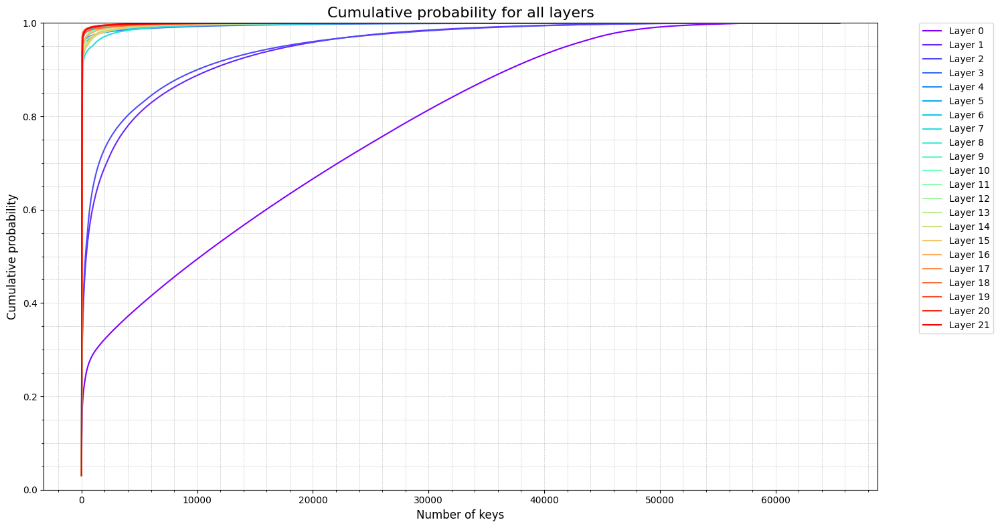

avg cum prob across layers


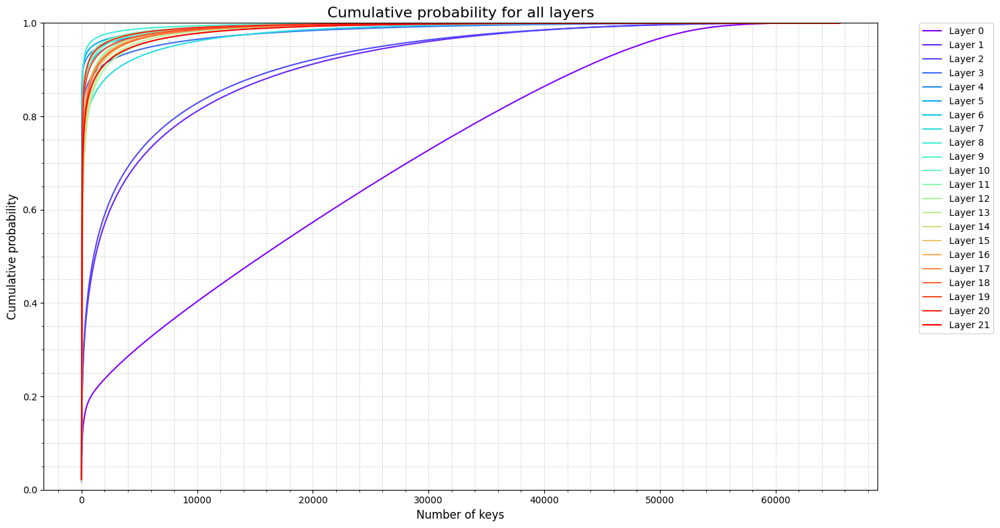

worst cum prob across layers


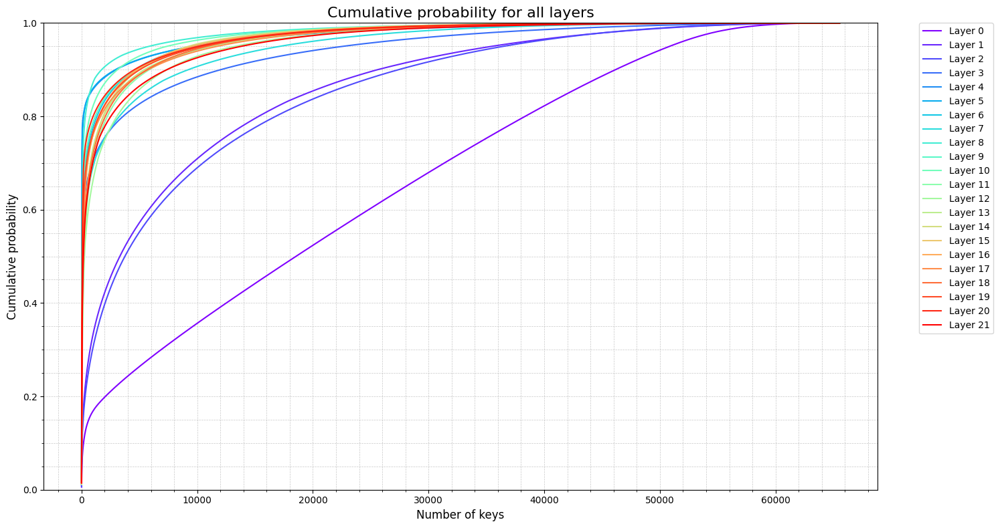

In [ ]:
# %%

for k in layer_cumsum_metrics.keys():
    print(f"{k} cum prob across layers")
    plot_cum_layer_prob(layer_cumsum_metrics[k].numpy())

In [ ]:
# %%

def plot_cum_prob_per_head(head_metrics):
    num_layers, num_heads, seq_length = head_metrics.shape

    # Create a color map for the heads
    colors = plt.cm.rainbow(np.linspace(0, 1, num_heads))

    for layer in range(num_layers):
        # Create a new figure for each layer
        plt.figure(figsize=(15, 8))

        for head in range(num_heads):
            # Get data for the current head
            head_data = head_metrics[layer, head, :]

            # Plot the line for this head
            plt.plot(
                range(seq_length), head_data, color=colors[head], label=f"Head {head}"
            )

        plt.title(f"Cumulative probability for Layer {layer}", fontsize=16)
        plt.xlabel("Number of keys", fontsize=12)
        plt.ylabel("Cumulative probability", fontsize=12)
        plt.ylim(0, 1)  # Assuming cumulative values are between 0 and 1

        # Add a legend
        plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)

        plt.tight_layout()
        plt.show()

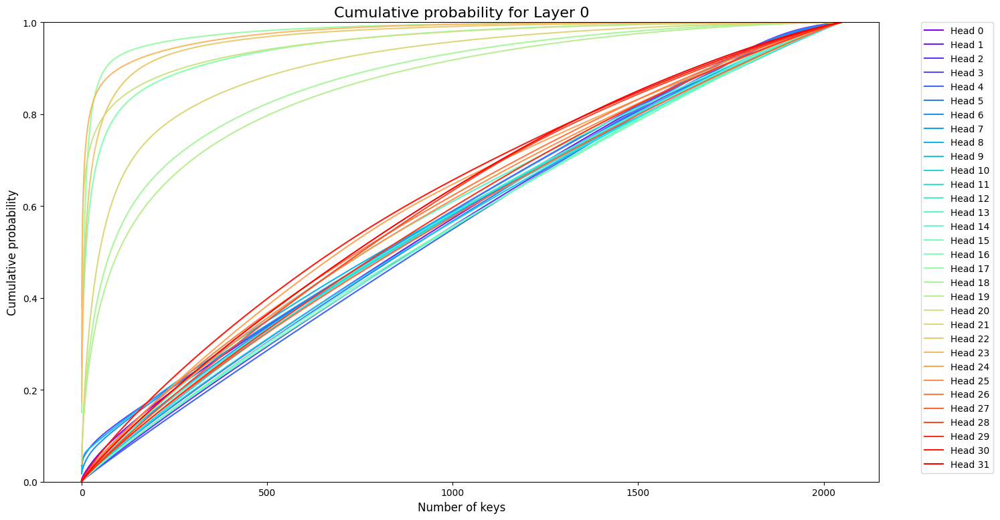

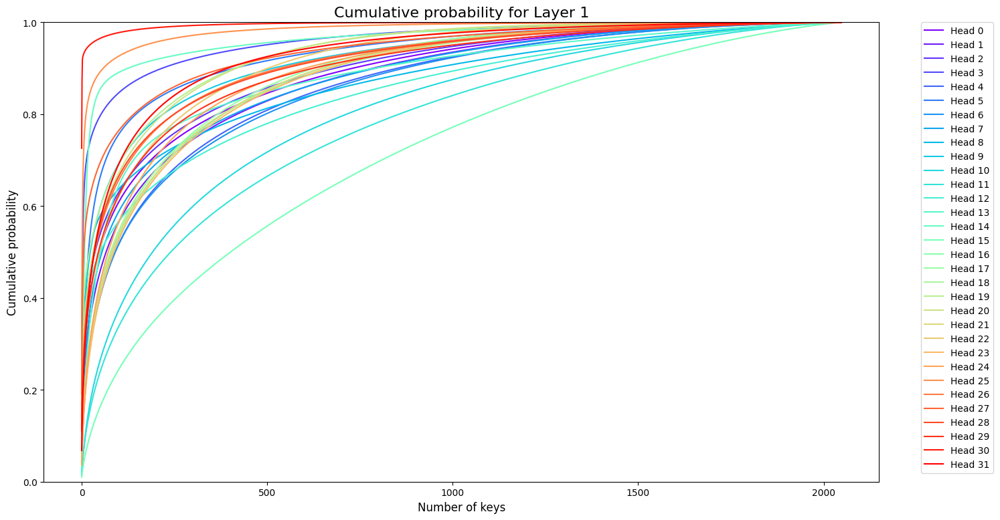

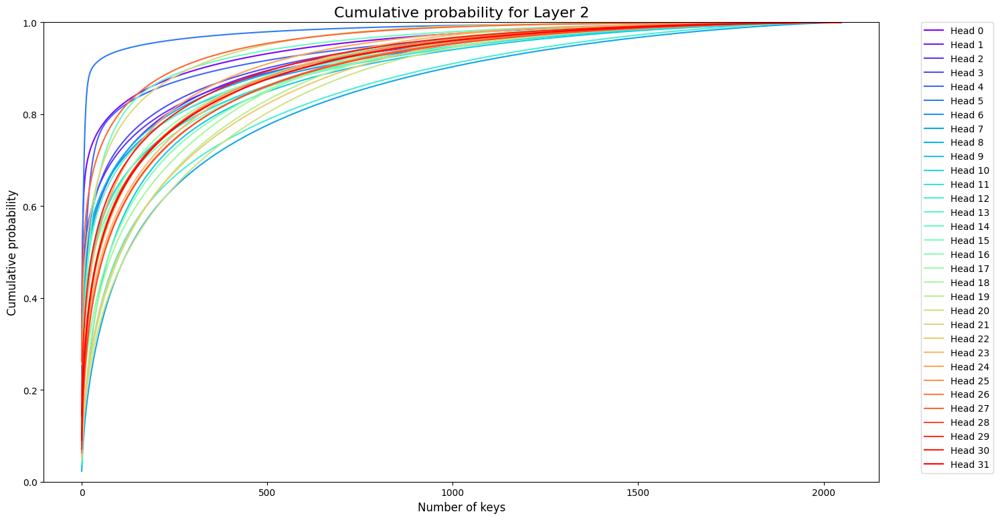

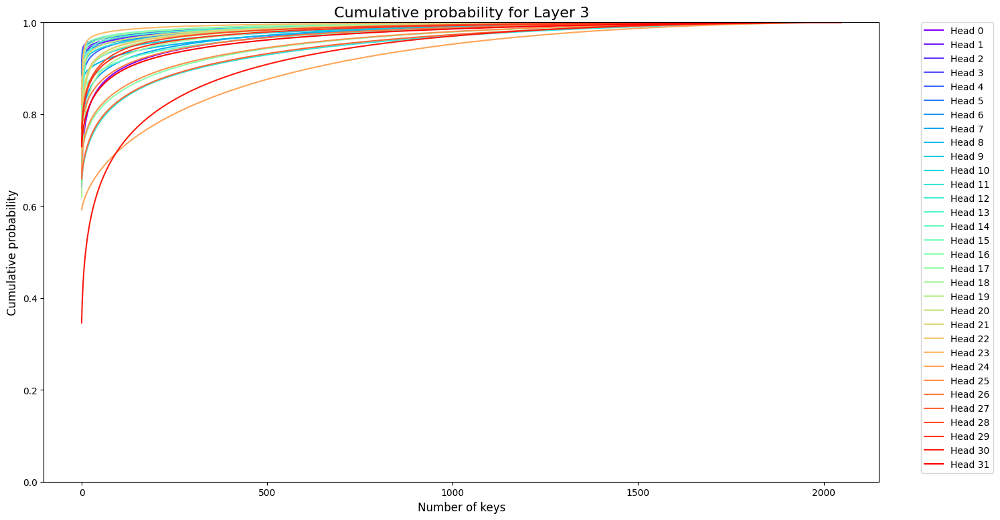

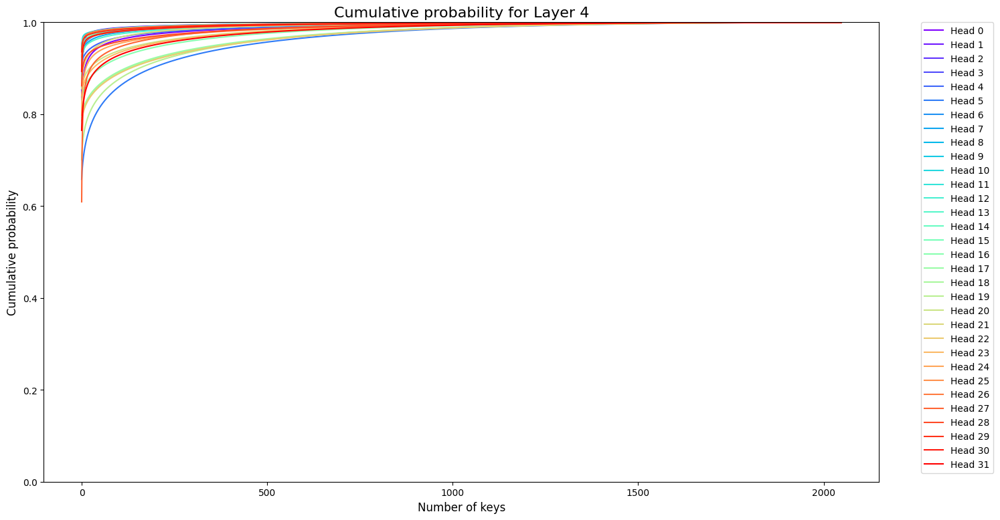

...

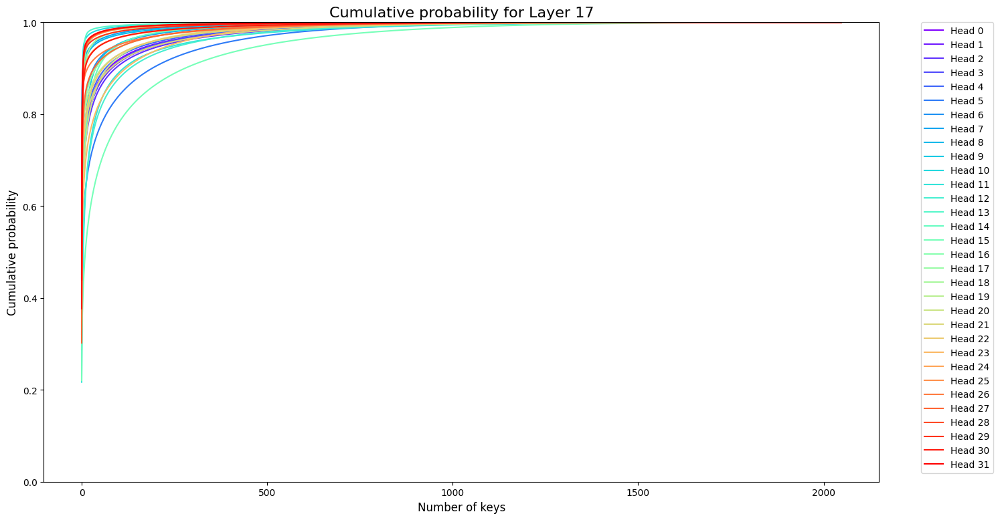

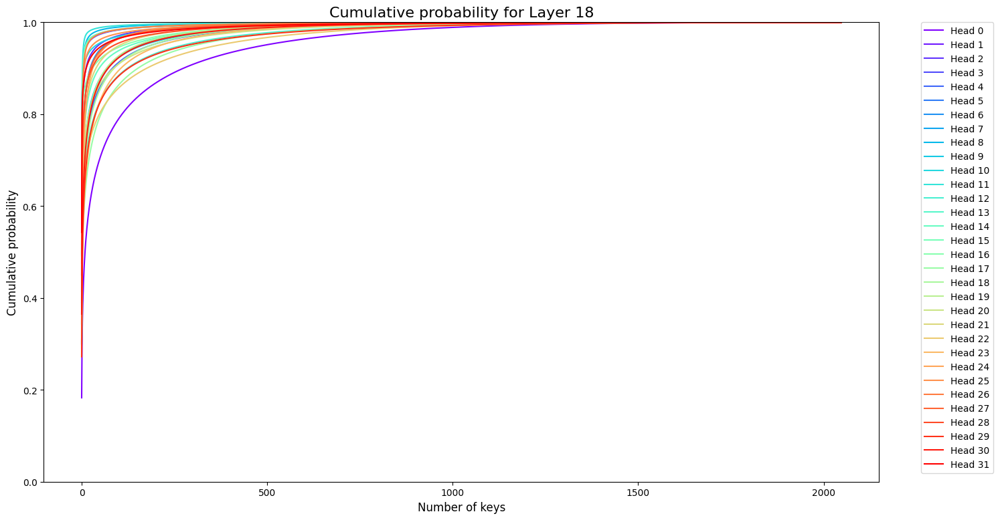

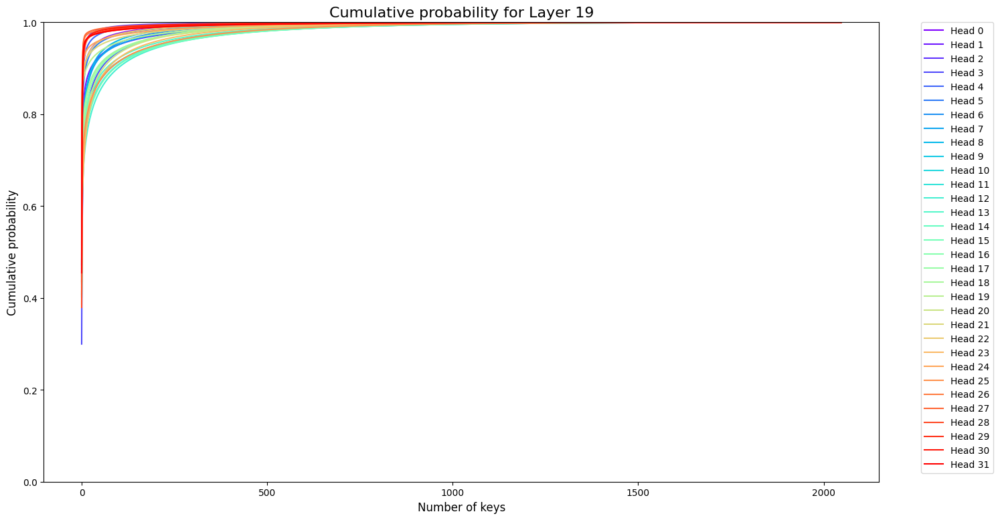

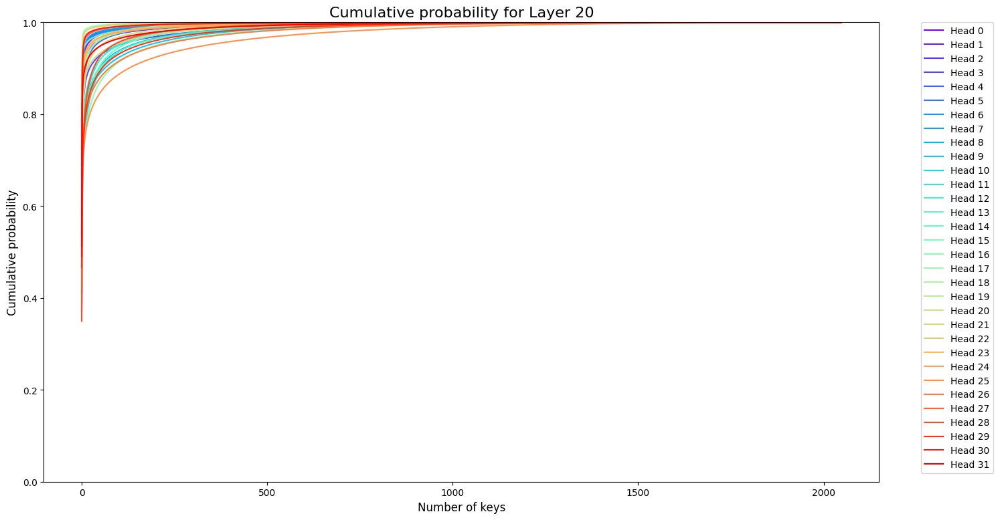

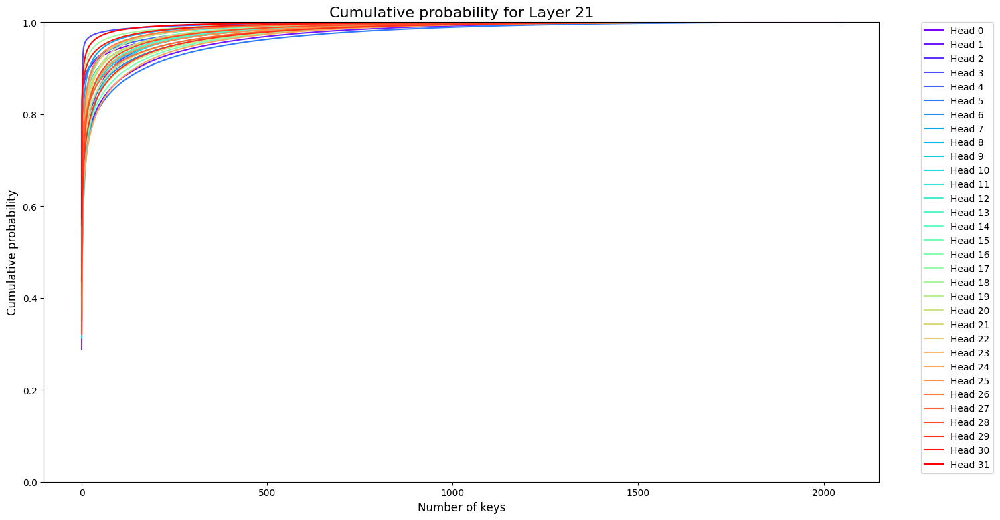

In [ ]:
# %%

plot_cum_prob_per_head(head_metrics["cum_prob"]["avg"].numpy())

In [ ]:
# %%

avg_layer_cumprob_np = layer_cumsum_metrics["avg"].numpy()
best_layer_cumprob_np = layer_cumsum_metrics["best"].numpy()
worst_layer_cumprob_np = layer_cumsum_metrics["worst"].numpy()
total_k_len = config.n_head * seq_len
probability_thresholds = [80, 90, 95, 99, 99.9]
for threshold in probability_thresholds:
    p_threshold = threshold / 100
    tokens_need_for_threshold = np.sum(avg_layer_cumprob_np <= p_threshold, axis=-1)

    print(
        f"percentage of keys needed for {threshold} % probability :\n {tokens_need_for_threshold / total_k_len * 100}"
    )

percentage of keys needed for 80 % probability :
 [5.35705566e+01 1.41769409e+01 1.25930786e+01 1.00708008e-01
 4.27246094e-02 4.57763672e-02 9.76562500e-02 6.94274902e-01
 9.30786133e-02 2.04467773e-01 1.81579590e-01 4.33349609e-01
 8.45336914e-01 7.82775879e-01 6.57653809e-01 4.39453125e-01
 4.40979004e-01 3.49426270e-01 4.50134277e-01 1.73950195e-01
 1.38854980e-01 4.77600098e-01]
percentage of keys needed for 90 % probability :
 [65.64331055 27.92510986 25.6652832   2.11029053  0.18463135  0.16937256
  0.79498291  4.50592041  0.19378662  0.84686279  0.66070557  1.61132812
  2.94494629  2.59246826  2.18505859  1.78070068  1.74255371  1.71356201
  1.89971924  1.00708008  0.6149292   2.45819092]
percentage of keys needed for 95 % probability :
 [73.11248779 41.54663086 39.60723877  9.48486328  2.49938965  1.38549805
  3.58428955 11.89117432  0.78887939  2.88391113  2.16064453  4.19464111
  7.18841553  6.18286133  5.29327393  4.81262207  4.64782715  4.97436523
  5.08880615  3.62701416 

In [ ]:
# %%

def plot_cum_prob_per_head_detailed(head_metrics):
    avg_metrics, best_metrics, worst_metrics = (
        head_metrics["avg"].numpy(),
        head_metrics["best"].numpy(),
        head_metrics["worst"].numpy(),
    )
    num_layers, num_heads, seq_length = avg_metrics.shape

    # Create a color map for the heads

    for layer in range(num_layers):
        # Create a new figure for each layer

        for head in range(num_heads):

            plt.figure(figsize=(15, 8))
            # Get data for the current head
            avg_head_metrics = avg_metrics[layer, head, :]
            best_head_metrics = best_metrics[layer, head, :]
            worst_head_metrics = worst_metrics[layer, head, :]

            colors = plt.cm.rainbow(np.linspace(0, 1, 3))

            plt.plot(
                range(seq_length),
                avg_head_metrics,
                color=colors[0],
                label=f"average",
            )
            plt.plot(
                range(seq_length),
                best_head_metrics,
                color=colors[1],
                label=f"best",
            )
            plt.plot(
                range(seq_length),
                worst_head_metrics,
                color=colors[2],
                label=f"worst",
            )

            plt.title(
                f"Cumulative probability for Layer {layer} Head {head}", fontsize=16
            )
            plt.xlabel("Sequence Position", fontsize=12)
            plt.ylabel("Cumulative probability", fontsize=12)
            plt.ylim(0, 1)  # Assuming cumulative values are between 0 and 1

            # Add a legend
            plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.0)

            plt.minorticks_on()

            plt.grid(True, which="both", linestyle="--", linewidth=0.5, alpha=0.7)

            plt.tight_layout()
            plt.show()

In [ ]:
# %%

if deep_dive_heads:
    plot_cum_prob_per_head_detailed(head_metrics["cum_prob"])

In [ ]:
# %%

from matplotlib.colors import SymLogNorm


def plot_att_wei_heatmap(att_wei_metric):
    # Convert to numpy if it's a PyTorch tensor
    if isinstance(att_wei_metric, torch.Tensor):
        att_wei_metric = att_wei_metric.detach().cpu().numpy()

    num_layers, num_heads, seq_length = att_wei_metric.shape

    # Create a figure with subplots for each layer
    fig, axes = plt.subplots(num_layers, 1, figsize=(15, 5 * num_layers))
    plt.subplots_adjust(top=0.95)
    fig.suptitle(
        "Attention Weights Difference from Mean (Symmetric Log Scale)",
        fontsize=16,
        y=1,
    )

    # Find global min and max for consistent color scaling across layers
    vmin, vmax = np.min(att_wei_metric), np.max(att_wei_metric)
    abs_max = max(abs(vmin), abs(vmax))

    # Define a symmetric log normalization
    norm = SymLogNorm(linthresh=1e-5, linscale=1, vmin=-abs_max, vmax=abs_max)

    for layer in range(num_layers):
        # Get data for the current layer
        layer_data = att_wei_metric[layer]

        # Create heatmap for the current layer
        im = sns.heatmap(
            layer_data,
            ax=axes[layer] if num_layers > 1 else axes,
            cmap="RdBu_r",
            norm=norm,
            cbar_kws={
                "label": "Difference from Mean",
                "format": lambda x, _: f"{x:+.2e}",
            },
        )
        ax = axes[layer] if num_layers > 1 else axes
        ax.set_title(f"Layer {layer}" if num_layers > 1 else "Attention Weights")
        ax.set_xlabel("Sequence Position")
        ax.set_ylabel("Head")

        # Adjust colorbar ticks
        cbar = im.collections[0].colorbar
        cbar.set_ticks([-abs_max, -1e-5, 0, 1e-5, abs_max])
        cbar.set_ticklabels([f"-{abs_max:.1e}", "-1e-5", "0", "1e-5", f"{abs_max:.1e}"])

    plt.tight_layout()
    plt.show()


def plot_att_wei_heatmap_single_layer(att_wei_metric, layer_index=0):
    # Ensure the layer_index is valid
    num_layers, num_heads, seq_length = att_wei_metric.shape
    if layer_index < 0 or layer_index >= num_layers:
        raise ValueError(f"Layer index must be between 0 and {num_layers-1}")

    # Get data for the specified layer
    layer_data = att_wei_metric[layer_index]

    # Apply log transformation to the data
    # We use -np.log10(x) to invert the scale, so smaller values appear more distinct
    # Add a small constant to avoid log(0), and clip to avoid infinities
    log_data = -np.log10(np.clip(layer_data, 1e-10, 1.0))

    # Normalize log_data to [0, 1] for consistent color scaling
    log_data_norm = (log_data - log_data.min()) / (log_data.max() - log_data.min())

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(15, 5))

    # Create heatmap for the layer
    sns.heatmap(
        log_data_norm,
        ax=ax,
        cmap="viridis",
        cbar_kws={
            "label": "Confidence Probability (lower is bigger)",
            "format": lambda x, _: f"{10**(-x * (log_data.max() - log_data.min()) - log_data.min()):.2e}",
        },
        vmin=0,
        vmax=1,
    )

    ax.set_title(f"Confidence Probabilities Heatmap for Layer {layer_index}")
    ax.set_xlabel("Sequence Position")
    ax.set_ylabel("Head")

    plt.tight_layout()
    plt.show()

bigcode/starcoderdata
best case distance from mean


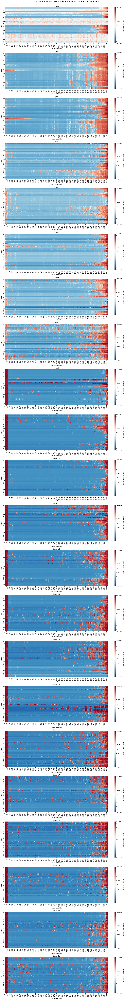

avg case distance from mean


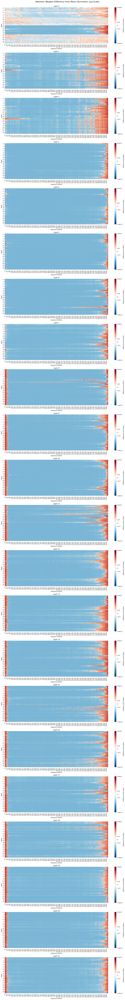

worst case distance from mean


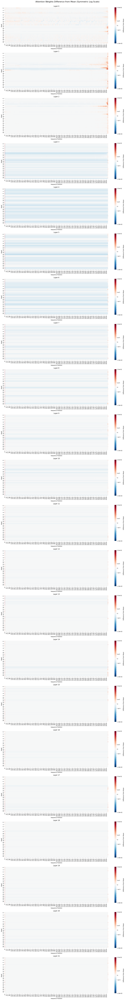

In [ ]:
# %%

print(dataset_type.value)
for k in head_metrics["att_wei"].keys():
    att_wei = head_metrics["att_wei"][k]
    # print(f"{k} case")
    # plot_att_wei_heatmap(att_wei)
    avg_att_wei = reduce(att_wei, "layer head k_len -> layer head", "mean").unsqueeze(
        -1
    )

    diff = (att_wei - avg_att_wei).numpy()
    print(f"{k} case distance from mean")
    plot_att_wei_heatmap(diff)